In [1]:
import os
import torch
import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
from tqdm import tqdm

from adj import main, combine_graph_dict
from train import train_model
from utils import mclust_R, fix_seed

In [2]:
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.metrics import normalized_mutual_info_score as nmi_score
from sklearn.metrics import adjusted_mutual_info_score as ami_score
from sklearn.metrics import homogeneity_score as hom_score
from sklearn.metrics import completeness_score as com_score
from sklearn.metrics import v_measure_score as v_score
from utils import compute_PAS, compute_CHAOS
from sklearn.decomposition import PCA

In [4]:
fix_seed(1)

In [4]:
def mapping2int(string_array):
    mapping = {}
    result = []
    for string in string_array:
        if string not in mapping:
            mapping[string] = len(mapping)
        result.append(mapping[string])
    return result, mapping

import anndata as ad

#load data
count = pd.read_csv(
        "../data/Mouse_Brain/GSE147747/GSE147747_expr_raw_counts_table.tsv",
        sep="\t", index_col=0)
meta = pd.read_csv("../data/Mouse_Brain/GSE147747/GSE147747_meta_table.tsv",
                       sep="\t",
                       index_col=0)

In [5]:
#creat adata
adata_st_all = ad.AnnData(X=count.values)
adata_st_all.obs.index = count.index
adata_st_all.obs = meta.loc[adata_st_all.obs.index]
adata_st_all.var.index = count.columns

slice_use = ['01A', '02A', '03A', '04B', '05A', '06B', '07A', '08B', '09A', '10B',
                 '11A', '12A', '13B', '14A', '15A', '16A', '17A', '18A', '19A', '20B',
                 '21A', '22A', '23A', '24A', '25A', '26A', '27A', '28A', '29A', '30A',
                 '31A', '32A', '33A', '34A', '35A', ]

result, mapping = mapping2int(slice_use)

adata_st_all = adata_st_all[[s in slice_use for s in adata_st_all.obs.section_index.values]]
sc.pp.filter_cells(adata_st_all, min_genes=1)

adata_st_all.obsm['spatial'] = np.concatenate(
        (adata_st_all.obs['HE_X'].values.reshape(-1, 1), adata_st_all.obs['HE_Y'].values.reshape(-1, 1)), axis=1)

for i, slice_id in enumerate(sorted(set(adata_st_all.obs.section_index.values))):
        adata_tmp = adata_st_all[adata_st_all.obs.section_index.values == slice_id]
        array_col = np.array([np.float32(loc.split("_")[1].split("x")[0]) for loc in adata_tmp.obs.index])
        if slice_id == '01A':
            array_col = array_col - 0.3
        array_row = np.array([np.float32(loc.split("_")[1].split("x")[1]) for loc in adata_tmp.obs.index])
        
        adata_tmp.obs['array_col'] = np.round(array_col)
        adata_tmp.obs['array_row'] = np.round(array_row)

        adata_tmp.obs['batch_name'] = slice_id
        adata_tmp.obs['slice_id'] = mapping[slice_id]
        
        adata_tmp.var_names_make_unique()
        
        # Remove mt-genes
        adata_tmp = adata_tmp[:, (np.array(~adata_tmp.var.index.str.startswith("mt-"))
                                  & np.array(~adata_tmp.var.index.str.startswith("MT-")))]
        adata_tmp.obs.index = adata_tmp.obs.index + "-slice%d" % i

        adata_tmp = adata_tmp[~pd.isnull(adata_tmp.obs['ABA_parent'])]

        graph_dict_tmp = main(adata_tmp, adj_cons_by='coordinate', distType='KNN', k_cutoff=8, rad_cutoff=250)
        
        if i == 0:
            adata = adata_tmp
            graph_dict = graph_dict_tmp
            name = slice_id
            adata.obs['proj_name'] = slice_id
        else:
            var_names = adata.var_names.intersection(adata_tmp.var_names)
            adata = adata[:, var_names]
            adata_tmp = adata_tmp[:, var_names]
            adata_tmp.obs['proj_name'] = slice_id

            adata = adata.concatenate(adata_tmp)
            graph_dict = combine_graph_dict(graph_dict, graph_dict_tmp)
            name = name + '_' + slice_id

------Calculating spatial graph...
The graph contains 1216 edges, 152 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 1920 edges, 240 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 2152 edges, 269 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 2608 edges, 326 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 2888 edges, 361 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3224 edges, 403 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3904 edges, 488 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3760 edges, 470 cells.
8.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 3928 edges, 491 cells.
8.0

In [6]:
# adata.write('adata_used.h5ad')

In [7]:
# import pickle
# 
# with open("graph_dict.pkl", "wb") as f:
#     pickle.dump(graph_dict, f)

In [8]:
# adata = sc.read_h5ad('adata_used.h5ad')
# 
# with open("graph_dict.pkl", "rb") as f:
#     graph_dict = pickle.load(f)

In [9]:
adata.layers['count'] = adata.X
sc.pp.filter_genes(adata, min_cells=50)
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", layer='count', n_top_genes=1000)
adata = adata[:, adata.var['highly_variable'] == True]
sc.pp.scale(adata)

from sklearn.decomposition import PCA  # sklearn PCA is used because PCA in scanpy is not stable. 
adata_X = PCA(n_components=200, random_state=42).fit_transform(adata.X)
adata.obsm['X_pca'] = adata_X

In [10]:
adata

AnnData object with n_obs × n_vars = 17086 × 1000
    obs: 'section_index', 'stereo_ML', 'stereo_DV', 'stereo_AP', 'HE_X', 'HE_Y', 'ABA_acronym', 'ABA_name', 'ABA_parent', 'nuclei_segmented', 'spot_radius', 'passed_QC', 'cluster_id', 'cluster_name', 'n_genes', 'array_col', 'array_row', 'batch_name', 'slice_id', 'proj_name', 'batch'
    var: 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg'
    obsm: 'spatial', 'X_pca'
    layers: 'count'

In [11]:
sedr_net = train_model(adata, graph_dict, pre_epochs=400 ,epochs=500, mask_rate=0.2)
using_dec = True
if using_dec:
    sedr_net.train_with_dec(num_aggre=1)
else:
    sedr_net.train_without_dec()

Epoch 399 total loss=9.786: 100%|██████████ [ time left: 00:00 ]              
Epoch 499 total loss=6.689 recon loss=5.680 kl loss=0.045 tri loss=0.559 : |           [ time left: 00:00 ]      


In [12]:
sedr_feat, _ = sedr_net.process()
adata.obsm['SEDR'] = sedr_feat

In [13]:
mclust_R(adata, num_cluster=15, used_obsm='SEDR')

R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


AnnData object with n_obs × n_vars = 17086 × 1000
    obs: 'section_index', 'stereo_ML', 'stereo_DV', 'stereo_AP', 'HE_X', 'HE_Y', 'ABA_acronym', 'ABA_name', 'ABA_parent', 'nuclei_segmented', 'spot_radius', 'passed_QC', 'cluster_id', 'cluster_name', 'n_genes', 'array_col', 'array_row', 'batch_name', 'slice_id', 'proj_name', 'batch', 'mclust'
    var: 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg'
    obsm: 'spatial', 'X_pca', 'Tri_SEDR', 'SEDR'
    layers: 'count'

In [3]:
adata.write("Ours_MOB")

NameError: name 'adata' is not defined

In [15]:
#adata = sc.read_h5ad('Ours_DLPFC_MOE1')

In [16]:
sub_adata = adata[~pd.isnull(adata.obs['ABA_parent'])]
ARI = ari_score(sub_adata.obs['ABA_parent'], sub_adata.obs['mclust'])
print(f"total ARI:{ARI}")
ARI_list = []
for name in slice_use:
    sub_adata_tmp = sub_adata[sub_adata.obs['batch_name'] == name]
    ARI = ari_score(sub_adata_tmp.obs['ABA_parent'], sub_adata_tmp.obs['mclust'])
    print(f"{name} ARI:{ARI}")
    ARI_list.append(ARI)
print('Mean:',np.mean(ARI_list))
print('Median:',np.median(ARI_list))

total ARI:0.3807776862318849
01A ARI:0.28557770831525675
02A ARI:0.31655717562888697
03A ARI:0.3064041008669604
04B ARI:0.3017762464732678
05A ARI:0.30947641601682613
06B ARI:0.40665018143147597
07A ARI:0.40638287841663556
08B ARI:0.4355254365330763
09A ARI:0.4901857633713682
10B ARI:0.45458474019280776
11A ARI:0.43319184423750257
12A ARI:0.4458419590208026
13B ARI:0.4240110765877342
14A ARI:0.4597728871333229
15A ARI:0.42107896324117866
16A ARI:0.40914950587161447
17A ARI:0.43354642884426936
18A ARI:0.4699443461887185
19A ARI:0.4736143269414954
20B ARI:0.4416186722778102
21A ARI:0.4771549845769965
22A ARI:0.46737887514682624
23A ARI:0.45146069061677674
24A ARI:0.3728388021398428
25A ARI:0.4818529778178684
26A ARI:0.46508760063361376
27A ARI:0.53420967224602
28A ARI:0.5527440810878668
29A ARI:0.55146432198209
30A ARI:0.4958181687953353
31A ARI:0.4427441264669464
32A ARI:0.39979153450954596
33A ARI:0.3368372832948608
34A ARI:0.35814949386837064
35A ARI:0.37522635552558187
Mean: 0.425361

In [17]:
sub_adata = adata[~pd.isnull(adata.obs['ABA_parent'])]
NMI = nmi_score(sub_adata.obs['ABA_parent'], sub_adata.obs['mclust'])
print(f"total NMI:{NMI}")
AMI = ami_score(sub_adata.obs['ABA_parent'], sub_adata.obs['mclust'])
print(f"total AMI:{AMI}")
NMI_list = []
AMI_list = []
for name in slice_use:
    sub_adata_tmp = sub_adata[sub_adata.obs['batch_name'] == name]
    NMI = nmi_score(sub_adata_tmp.obs['ABA_parent'], sub_adata_tmp.obs['mclust'])
    AMI = ami_score(sub_adata_tmp.obs['ABA_parent'], sub_adata_tmp.obs['mclust'])
    ACC = 1/2 * (NMI + AMI)
    print(f"{name} ACC:{ACC}")
    NMI_list.append(NMI)
    AMI_list.append(AMI)
print('NMI Mean:',np.mean(NMI_list))
print('NMI Median:',np.median(NMI_list))
print('AMI Mean:',np.mean(AMI_list))
print('AMI Median:',np.median(AMI_list))

total NMI:0.5679916967512942
total AMI:0.5669362245348846
01A ACC:0.29373210545093775
02A ACC:0.41638683667173154
03A ACC:0.4698190038798787
04B ACC:0.4527972151437436
05A ACC:0.48302179790506505
06B ACC:0.5448661303639846
07A ACC:0.5372856814470149
08B ACC:0.5520775761609451
09A ACC:0.6125092995832756
10B ACC:0.5768882875202803
11A ACC:0.5627532338058823
12A ACC:0.583230531946531
13B ACC:0.596430846072087
14A ACC:0.5937186975216856
15A ACC:0.5818425428124072
16A ACC:0.5791738638698658
17A ACC:0.5924160488499932
18A ACC:0.6244094176756605
19A ACC:0.6030355625131596
20B ACC:0.6077369023182604
21A ACC:0.6265793539554392
22A ACC:0.6364940050871957
23A ACC:0.6458357657235809
24A ACC:0.5807125097544492
25A ACC:0.5585129350156519
26A ACC:0.5912272138512047
27A ACC:0.6240710085494992
28A ACC:0.6155475707689284
29A ACC:0.601873078558974
30A ACC:0.5651735392324015
31A ACC:0.5326650666810907
32A ACC:0.46930059569200455
33A ACC:0.4764899737481371
34A ACC:0.497546705914623
35A ACC:0.49453127668589

In [18]:
sub_adata = adata[~pd.isnull(adata.obs['ABA_parent'])]
HOM = hom_score(sub_adata.obs['ABA_parent'], sub_adata.obs['mclust'])
print(f"total HOM:{HOM}")
COM = com_score(sub_adata.obs['ABA_parent'], sub_adata.obs['mclust'])
print(f"total COM:{COM}")
V_list = []
for name in slice_use:
    sub_adata_tmp = sub_adata[sub_adata.obs['batch_name'] == name]
    HOM = hom_score(sub_adata_tmp.obs['ABA_parent'], sub_adata_tmp.obs['mclust'])
    COM = com_score(sub_adata_tmp.obs['ABA_parent'], sub_adata_tmp.obs['mclust'])
    V =  2 * ((HOM * COM) / (HOM + COM))
    print(f"{name} V:{V}")
    V_list.append(V)
print('V Mean:',np.mean(V_list))
print('V Median:',np.median(V_list))

total HOM:0.608118249255386
total COM:0.5328328361175987
01A V:0.3016461870740735
02A V:0.422426718597862
03A V:0.4810479358164671
04B V:0.4643168949758731
05A V:0.49471232880808436
06B V:0.5557781866103527
07A V:0.5465667279863331
08B V:0.5630607786622249
09A V:0.6207268430693549
10B V:0.5862538687334141
11A V:0.5738728580508892
12A V:0.5943150458897974
13B V:0.6064402011469752
14A V:0.6046225199592608
15A V:0.593024626700403
16A V:0.590960384116456
17A V:0.6030503833168396
18A V:0.6348515495547589
19A V:0.6133842783911907
20B V:0.6188053479040742
21A V:0.6353602008981272
22A V:0.645605587539381
23A V:0.6552414421758951
24A V:0.5921369217087746
25A V:0.57140839225141
26A V:0.6009573300563574
27A V:0.6317617372529271
28A V:0.6228379347505499
29A V:0.6096306086897325
30A V:0.5729379365431051
31A V:0.5398022405413515
32A V:0.4770651109518299
33A V:0.48254122347266776
34A V:0.5040611568119078
35A V:0.5030851494026087
V Mean: 0.5632656182403232
V Median: 0.590960384116456


5.443096264609047
1.1241789476460262


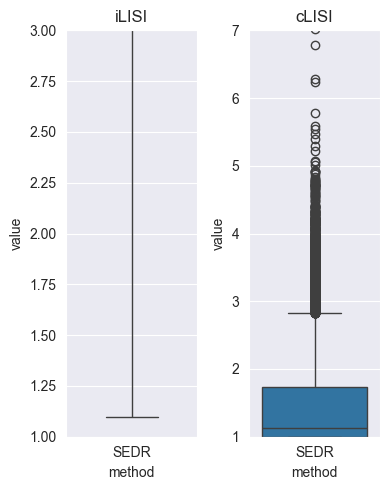

In [19]:
import harmonypy as hm

iLISI = hm.compute_lisi(adata.obsm['SEDR'], adata.obs[['batch_name']], label_colnames=['batch_name'])[:, 0]
cLISI = hm.compute_lisi(adata.obsm['SEDR'], adata.obs[['ABA_parent']], label_colnames=['ABA_parent'])[:, 0]
df_iLISI = pd.DataFrame({
    'method': 'SEDR',
    'value': iLISI,
    'type': ['ILISI'] * len(iLISI)
})

df_cLISI = pd.DataFrame({
    'method': 'SEDR',
    'value': cLISI,
    'type': ['CLISI'] * len(cLISI)
})

fig, axes = plt.subplots(1, 2, figsize=(4, 5))
sns.boxplot(data=df_iLISI, x='method', y='value', ax=axes[0])
sns.boxplot(data=df_cLISI, x='method', y='value', ax=axes[1])
axes[0].set_ylim(1, 3)
axes[1].set_ylim(1, 7)
axes[0].set_title('iLISI')
axes[1].set_title('cLISI')

plt.tight_layout()
print(np.median(iLISI))
print(np.median(cLISI))

In [3]:
adata = sc.read_h5ad('Ours_MOB')

In [4]:
slice_use = ['01A', '02A', '03A', '04B', '05A', '06B', '07A', '08B', '09A', '10B',
                 '11A', '12A', '13B', '14A', '15A', '16A', '17A', '18A', '19A', '20B',
                 '21A', '22A', '23A', '24A', '25A', '26A', '27A', '28A', '29A', '30A',
                 '31A', '32A', '33A', '34A', '35A', ]

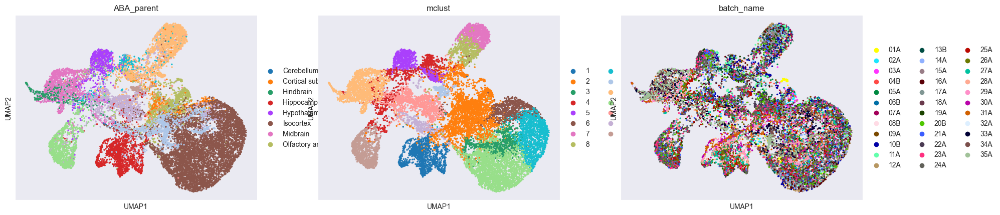

In [5]:
#UMAP
sc.pp.neighbors(adata, use_rep='SEDR', metric='cosine')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['ABA_parent', 'mclust', 'batch_name'], show=True, size=25, save=False)

In [6]:
Batch_key = 'batch_name' #BT_key
Annotation_key = 'ABA_parent' #GT_key
Perd_key = 'mclust' #PD_key
Latent_key = 'SEDR' #LT_key

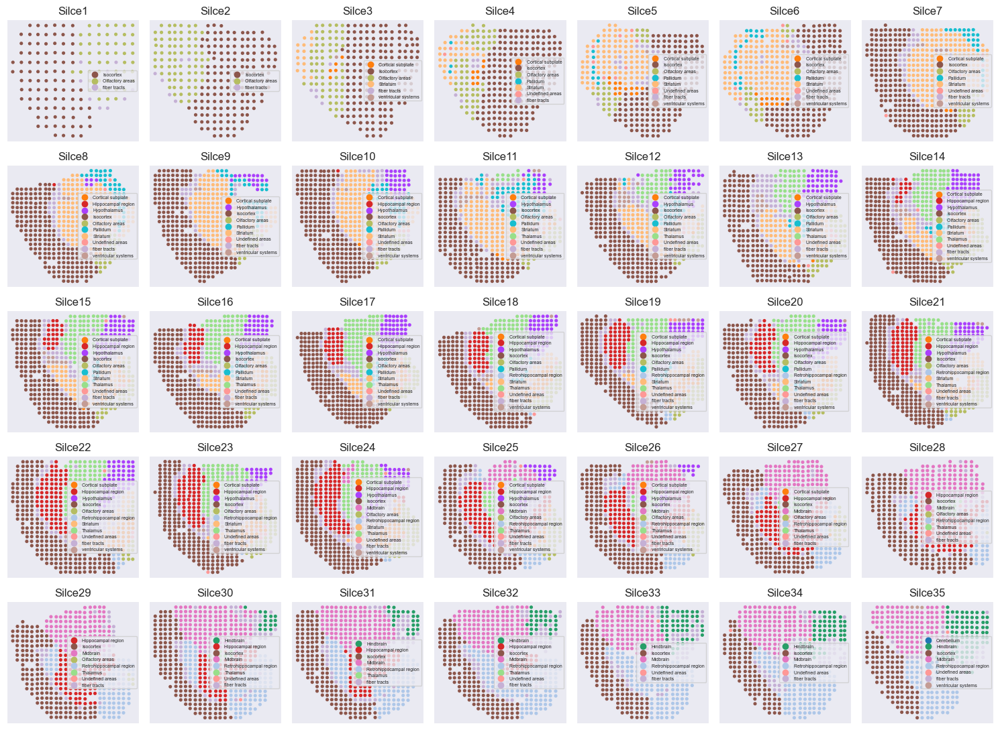

In [20]:
plt.figure(figsize=(15, 11))
k = 1
for i in range(len(slice_use)):
    adata_tmp = adata[adata.obs[Batch_key] == slice_use[i]]
    ax = plt.subplot(5, 7, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Annotation_key, s=55, ax=ax, show=False, legend_loc='right', legend_fontsize=5)
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    ax.set_xlabel('')  # 去掉x轴标题
    ax.set_ylabel('')  # 去掉y轴标题
    plt.title(f'Silce{i + 1}')
    k += 1
plt.tight_layout()
plt.show()

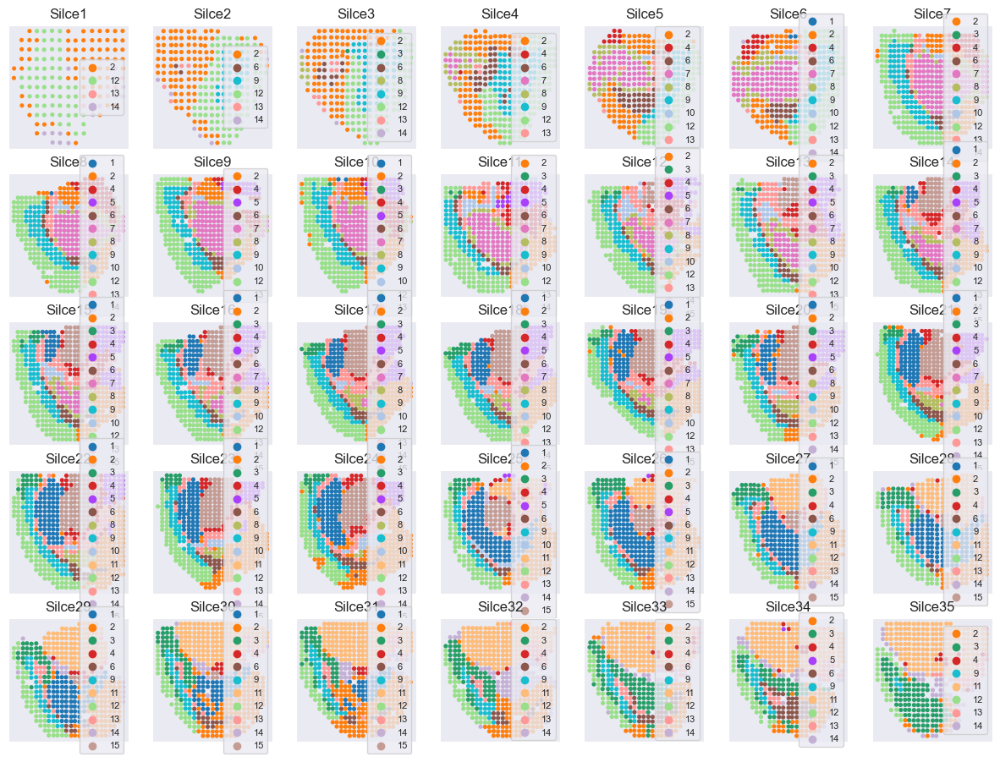

In [17]:
plt.figure(figsize=(15, 11))
k = 1
for i in range(len(slice_use)):
    adata_tmp = adata[adata.obs[Batch_key] == slice_use[i]]
    ax = plt.subplot(5, 7, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=55, ax=ax, show=False, legend_loc='right', legend_fontsize=8)
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    ax.set_xlabel('')  # 去掉x轴标题
    ax.set_ylabel('')  # 去掉y轴标题
    plt.title(f'Silce{i + 1}')
    k += 1

In [62]:
find_slice = ['11A', '12A', '13B', '14A', '15A', '16A', '17A', '18A', '19A', '20B',
              '21A', '22A', '23A', '24A', '25A', '26A', '27A', '28A', '29A', '30A', ]

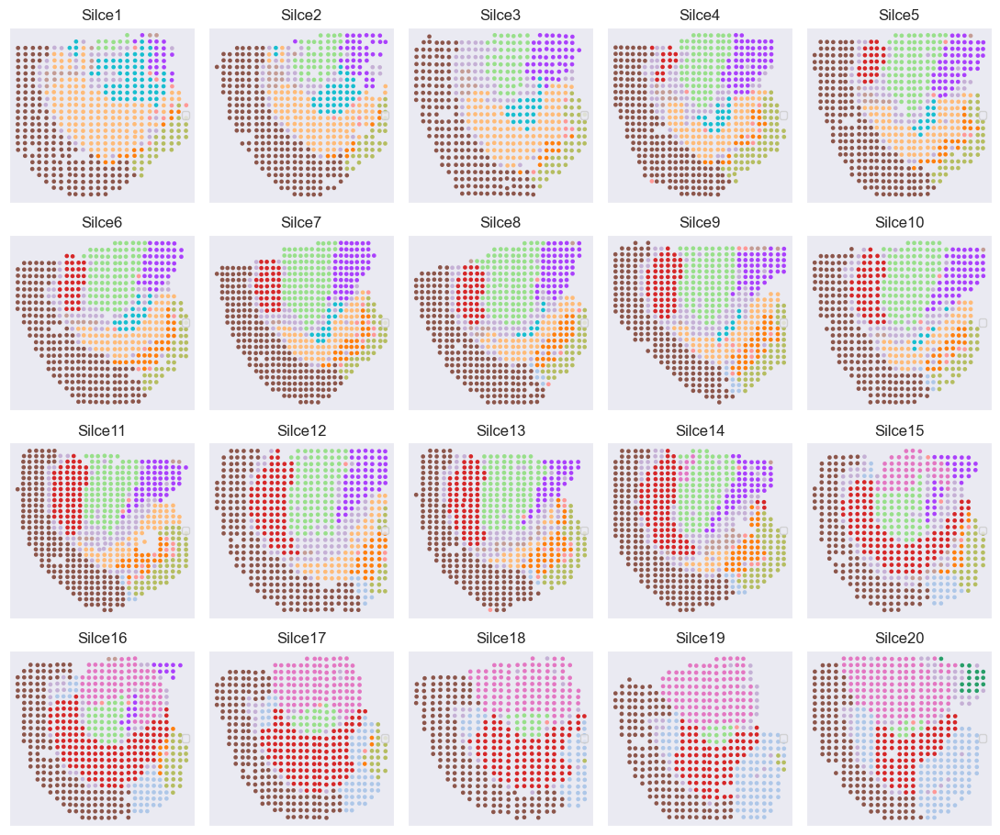

In [63]:
plt.figure(figsize=(11, 16))
k = 1
for slice_id, slice_name in enumerate(find_slice):
    adata_tmp = adata[adata.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Annotation_key, s=45, ax=ax, show=False, legend_loc='best')
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='right', fontsize=8)
    
    ax.set_xlabel('')  # 去掉x轴标题
    ax.set_ylabel('')  # 去掉y轴标题
    plt.title(f'Silce{slice_id + 1}')
    k += 1
# 显示所有子图
plt.tight_layout()
plt.show()

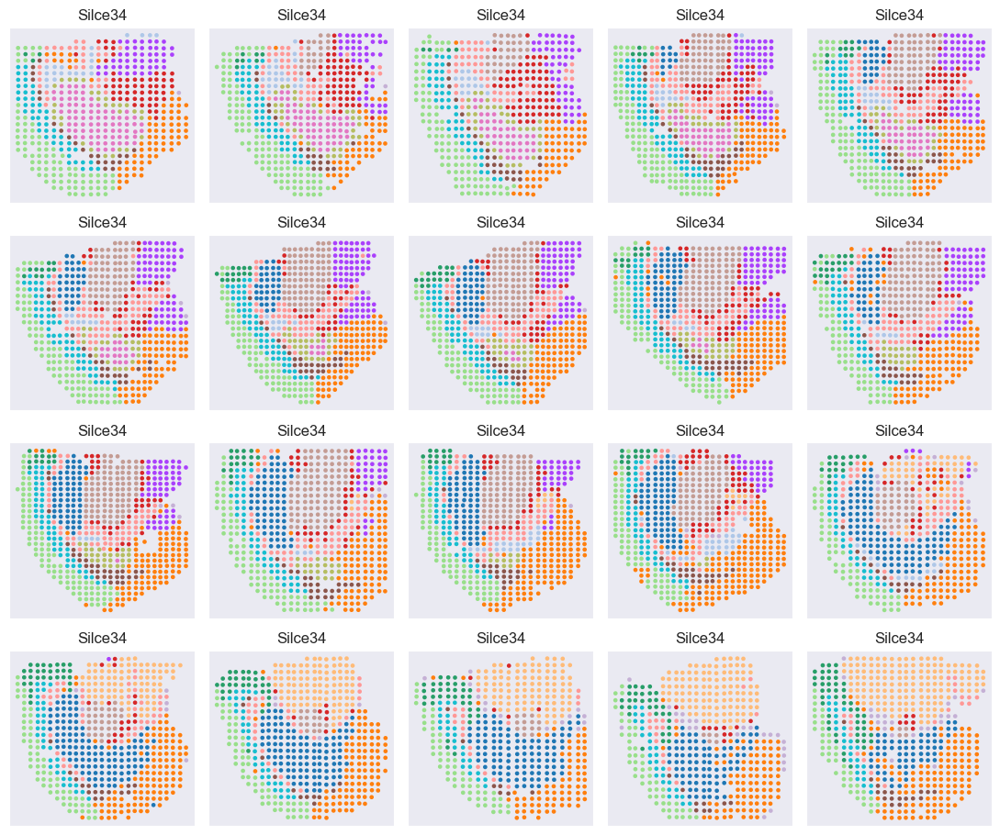

In [64]:
plt.figure(figsize=(11, 16))
k = 1
for slice_id, slice_name in enumerate(find_slice):
    adata_tmp = adata[adata.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=45, ax=ax, show=False, legend_loc='best')
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    ax.set_xlabel('')  # 去掉x轴标题
    ax.set_ylabel('')  # 去掉y轴标题
    plt.title(f'Silce{i + 1}')
    k += 1
# 显示所有子图
plt.tight_layout()
plt.show()

In [ ]:
# colors = [
#     '#1f77b4',  # 1.蓝色
#     '#ff7f0e',  # 2.橙色
#     '#279e68',  # 3.绿色
#     '#d62728',  # 4.红色
#     '#aa40fc',  # 5.紫色
#     '#8c564b',  # 6.褐色
#     '#e377c2',  # 7.粉色
#     '#b5bd61',  # 8.黄绿色
#     '#17becf',  # 9.青色
#     '#999999',  # 10.灰色
#     '#ffbb78',  # 11.淡橙色
#     '#98df8a',  # 12.淡绿色
#     '#ff9896',  # 13.淡粉
#     '#c5b0d5',  # 14.淡紫色
#     '#5d4d4a',  #15肉色
# ]

In [8]:
find_slice = slice_use

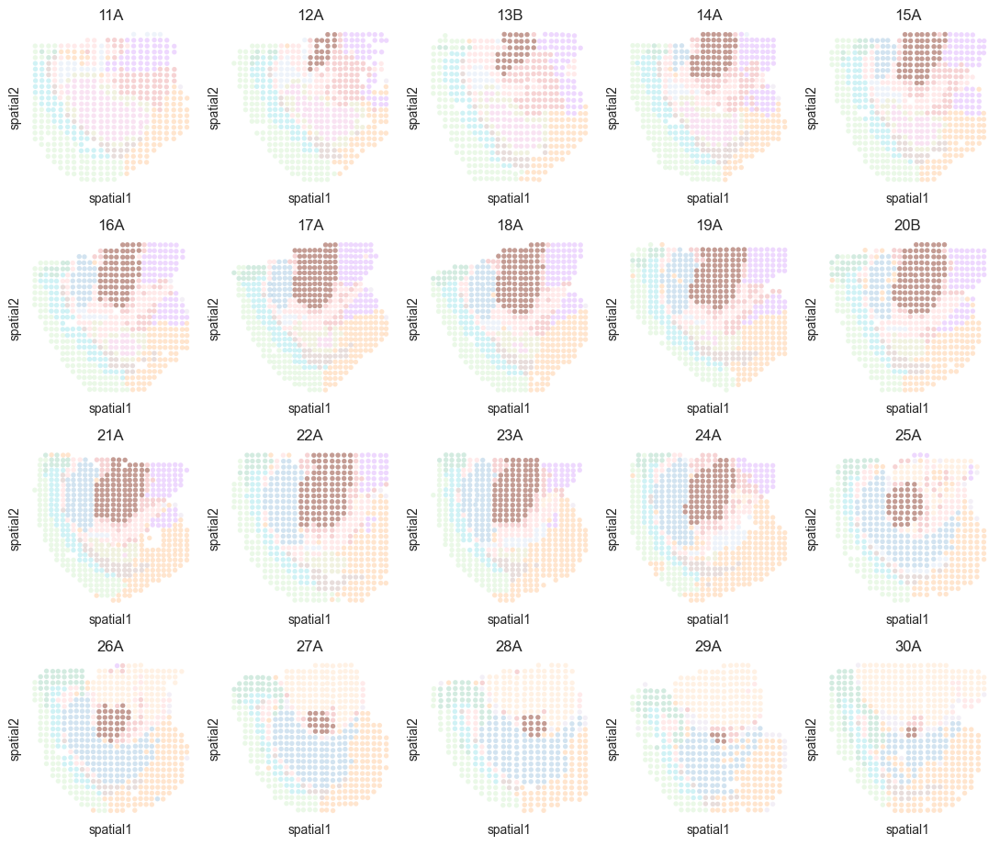

In [25]:
# sub = adata[adata.obs['mclust'] == 3]
# sc.pl.spatial(sub, spot_size=30, color='mclust', ax=axes[i], legend_loc=None, show=False)
# find_slice = slice_use
plt.rcParams['axes.facecolor'] = 'white'

target_domain = 1
sub = adata[adata.obs['mclust'] == target_domain]
subnon = adata[adata.obs['mclust'] != target_domain]
plt.figure(figsize=(11, 16))
k = 1
for slice_id, slice_name in enumerate(find_slice):
    adata_tmp = sub[sub.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=False, alpha=1)
    
    
    adata_tmp = subnon[subnon.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=False, alpha=0.2)
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    plt.title(f'{slice_name}')
    k += 1
plt.tight_layout()

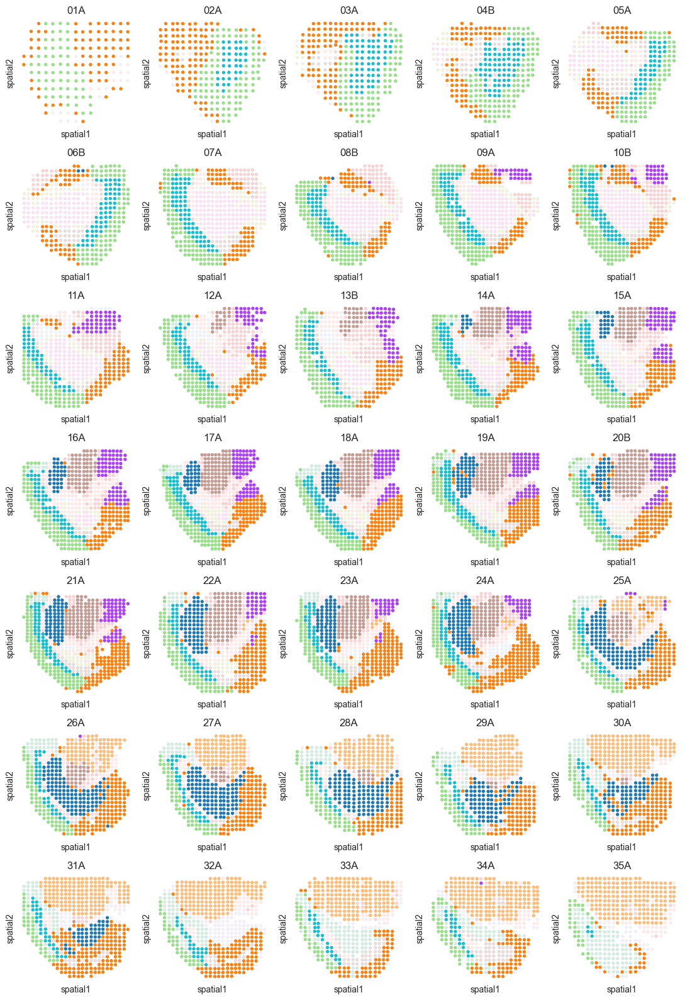

In [36]:
plt.rcParams['axes.facecolor'] = 'white'

target_domain1 = 1
target_domain2 = 2
target_domain3 = 9
target_domain4 = 12
target_domain5 = 15
target_domain6 = 5
target_domain7 = 11
sub1 = adata[adata.obs['mclust'] == target_domain1 ]
sub2 = adata[adata.obs['mclust'] == target_domain2 ]
sub3 = adata[adata.obs['mclust'] == target_domain3 ]
sub4 = adata[adata.obs['mclust'] == target_domain4 ]
sub5 = adata[adata.obs['mclust'] == target_domain5 ]
sub6 = adata[adata.obs['mclust'] == target_domain6 ]
sub7 = adata[adata.obs['mclust'] == target_domain7 ]
subnon = adata[adata.obs['mclust'] != target_domain1]
subnon = subnon[subnon.obs['mclust'] != target_domain2]
subnon = subnon[subnon.obs['mclust'] != target_domain3]
subnon = subnon[subnon.obs['mclust'] != target_domain4]
subnon = subnon[subnon.obs['mclust'] != target_domain5]
subnon = subnon[subnon.obs['mclust'] != target_domain6]
subnon = subnon[subnon.obs['mclust'] != target_domain7]
# sub = adata[adata.obs['mclust'] == 3]
# sc.pl.spatial(sub, spot_size=30, color='mclust', ax=axes[i], legend_loc=None, show=False)
# find_slice = slice_use
plt.figure(figsize=(11, 16))
k = 1
for slice_id, slice_name in enumerate(slice_use):
    adata_tmp = sub1[sub1.obs[Batch_key] == slice_use[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub2[sub2.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub3[sub3.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub4[sub4.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub5[sub5.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub6[sub6.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    adata_tmp = sub7[sub7.obs[Batch_key] == slice_use[slice_id]]
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=1)
    
    adata_tmp = subnon[subnon.obs[Batch_key] == slice_use[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Perd_key, s=60, ax=ax, show=False, legend_loc=None, alpha=0.2)
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    plt.title(f'{slice_name}')
    k += 1
plt.tight_layout()

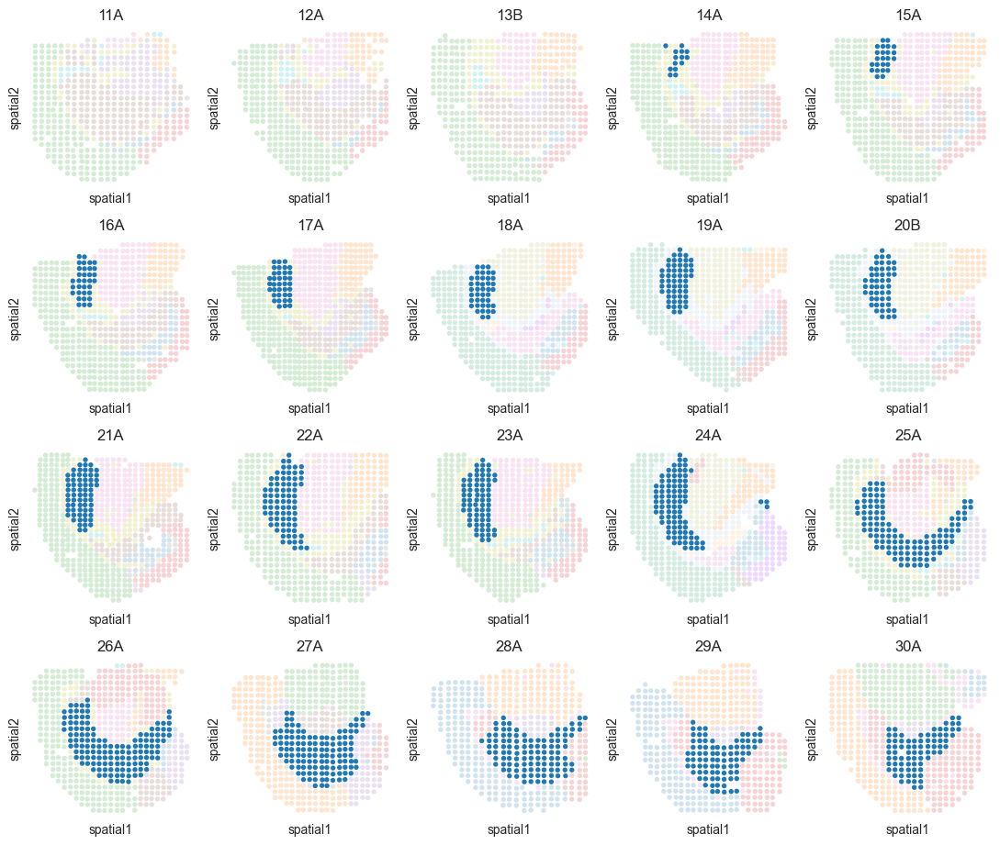

In [81]:
# sub = adata[adata.obs['mclust'] == 3]
# sc.pl.spatial(sub, spot_size=30, color='mclust', ax=axes[i], legend_loc=None, show=False)
# find_slice = slice_use
plt.rcParams['axes.facecolor'] = 'white'

target_domain = 'Hippocampal region'
sub = adata[adata.obs['ABA_parent'] == target_domain]
subnon = adata[adata.obs['ABA_parent'] != target_domain]


plt.figure(figsize=(11, 16))
k = 1
for slice_id, slice_name in enumerate(find_slice):
    adata_tmp = sub[sub.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Annotation_key, s=60, ax=ax, show=False, legend_loc=False, alpha=1)
    
    
    adata_tmp = subnon[subnon.obs[Batch_key] == find_slice[slice_id]]
    ax = plt.subplot(7, 5, k)
    sc.pl.embedding(adata_tmp, basis='spatial', color=Annotation_key, s=60, ax=ax, show=False, legend_loc=False, alpha=0.2)
    # sc.pl.embedding(adata_list[i], basis='spatial', color='spatial_domain', s=45, ax=ax, show=False)
    plt.title(f'{slice_name}')
    k += 1
plt.tight_layout()

In [ ]:
#########聚类占比

In [14]:
plt.rcParams['axes.facecolor'] = 'white'  # 设置子图的背景颜色
plt.rcParams['figure.facecolor'] = 'white'  # 设置整张图的背景颜色

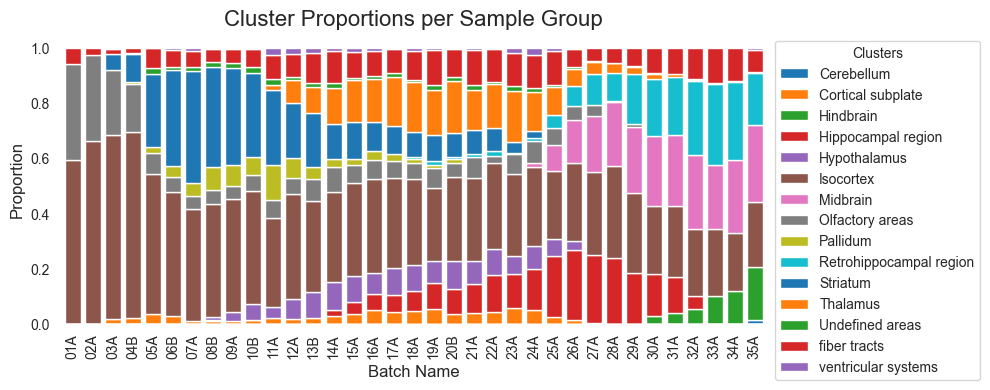

In [17]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc

# 假设你的聚类结果保存在 adata.obs['mclust']
# 这里我们将聚类标签转换为 DataFrame
cluster_counts = adata.obs['mclust'].value_counts()

# 计算聚类比例
cluster_proportions = cluster_counts / cluster_counts.sum()

# 如果你有多个样本，假设每个样本的聚类标签为分类数据，进行聚类的比例汇总
# 可以按照样本进行统计（例如按某个特定变量或样本的ID列进行分组）

# 假设你希望按样本或者组别对比例进行堆叠柱状图展示：
# 你可以用 `pd.crosstab` 来查看每个聚类在不同样本中的分布

# 如果你有样本的组别信息，假设为 'sample_group'
# 示例：创建一个假的 sample_group 列（假设它已经存在于 adata.obs 中）

# 绘制堆叠柱状图
# 计算每个样本组别中每个聚类的比例
sample_groups = adata.obs['batch_name']  # 如果有这个列
cluster_by_group = pd.crosstab(sample_groups, adata.obs['ABA_parent'], normalize='index')

# 绘制堆叠柱状图
fig, ax = plt.subplots(figsize=(10, 4))
cluster_by_group.plot(kind='bar', stacked=True, ax=ax, width=0.8)

# 设置标题和标签
ax.set_title('Cluster Proportions per Sample Group', fontsize=16)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_xlabel('Batch Name', fontsize=12)

# 显示图例
plt.legend(title="Clusters", loc='upper left', bbox_to_anchor=(1, 1))

# 显示图形
plt.tight_layout()
plt.show()

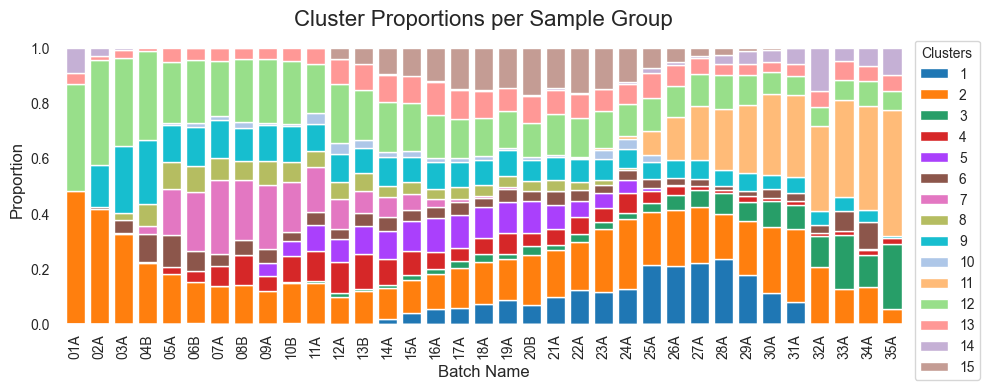

In [38]:
cluster_counts = adata.obs['mclust'].value_counts()

# 计算聚类比例
cluster_proportions = cluster_counts / cluster_counts.sum()

# 如果你有多个样本，假设每个样本的聚类标签为分类数据，进行聚类的比例汇总
# 可以按照样本进行统计（例如按某个特定变量或样本的ID列进行分组）

# 假设你希望按样本或者组别对比例进行堆叠柱状图展示：
# 你可以用 `pd.crosstab` 来查看每个聚类在不同样本中的分布

# 如果你有样本的组别信息，假设为 'sample_group'
# 示例：创建一个假的 sample_group 列（假设它已经存在于 adata.obs 中）

# 绘制堆叠柱状图
# 计算每个样本组别中每个聚类的比例
sample_groups = adata.obs['batch_name']  # 如果有这个列
cluster_by_group = pd.crosstab(sample_groups, adata.obs['mclust'], normalize='index')

# 找到每个 batch 中占比最大的聚类
max_clusters = cluster_by_group.idxmax(axis=1)
max_cluster_proportions = cluster_by_group.max(axis=1)

#15个颜色的调色板
colors = [
    '#1f77b4',  # 1.蓝色
    '#ff7f0e',  # 2.橙色
    '#279e68',  # 3.绿色
    '#d62728',  # 4.红色
    '#aa40fc',  # 5.紫色
    '#8c564b',  # 6.褐色
    '#e377c2',  # 7.粉色
    '#b5bd61',  # 8.黄绿色
    '#17becf',  # 9.青色
    '#aec7e8',  # 10.灰色
    '#ffbb78',  # 11.淡橙色
    '#98df8a',  # 12.淡绿色
    '#ff9896',  # 13.淡粉
    '#c5b0d5',  # 14.淡紫色
    '#c49c94',  # 15.肉色
]
#colors = ['#5c839f', '#946943', '#639763', '#8d5353', '#655573', '#8a736e', '#683e5b', '#707070', '#99995a', '#53959b', '#5c839f', '#f1d7a2', '#999999', '#8d5353', '#655573']

# 绘制堆叠柱状图
fig, ax = plt.subplots(figsize=(10, 4))
cluster_by_group.plot(kind='bar', stacked=True, ax=ax, width=0.8 ,color=colors)

# 设置标题和标签
ax.set_title('Cluster Proportions per Sample Group', fontsize=16)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_xlabel('Batch Name', fontsize=12)

# 显示图例
plt.legend(title="Clusters", loc='upper left', bbox_to_anchor=(1, 1))

# 显示图形
plt.tight_layout()
plt.show()

In [52]:
# 在每个柱形图上添加占比最大的聚类
for i, batch in enumerate(cluster_by_group.index):
    # 获取每个batch的最大聚类名称和比例
    max_cluster = max_clusters[batch]
    max_proportion = max_cluster_proportions[batch]
    print(max_cluster)

2
2
2
12
12
12
7
12
12
12
12
12
12
12
12
12
15
15
2
2
2
2
2
2
1
1
1
1
11
11
11
11
11
11
11


In [ ]:
#Genes

In [45]:
adata.obs['mclust'] = adata.obs['mclust'].astype(str)

In [46]:
sc.tl.rank_genes_groups(adata, 'mclust', groups=['2'], reference='1', key_added = "2vs1")

cut_log2fc_min = 2

g_list = list(sc.get.rank_genes_groups_df(adata, group='2', key='2vs1', pval_cutoff=0.05, log2fc_min=cut_log2fc_min)['names'])
g_list

['Nov',
 'Lypd1',
 'Hpcal4',
 'Ly6h',
 'Nr2f2',
 'Snx10',
 'Slc30a3',
 'Dcn',
 'Acvr2a',
 'Nnat',
 'Marcksl1',
 'Cnih3',
 'Trhr',
 'Pde1a',
 'Basp1',
 'Ncald',
 'Reln',
 'Wfs1',
 'Tiam1',
 'Cyp26b1',
 'Ildr2',
 'Dio3',
 'Crhbp',
 'Fezf2',
 'Hcn1',
 'Gabra4',
 'Ano3',
 'Kcnc2',
 'Stac2',
 'Slc6a3',
 'Scn1b',
 'Prkcd',
 'Fndc5']

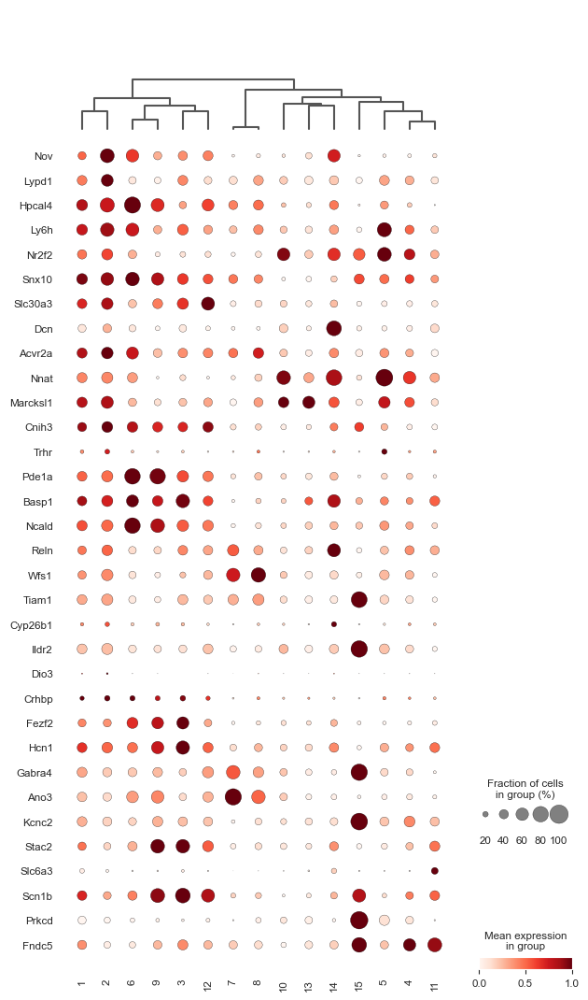

In [47]:
sc.pl.dotplot(adata, g_list, groupby='mclust', dendrogram=True, swap_axes=True,standard_scale='var')

In [28]:
#g_list = ['Neurod6', 'Gng4', 'Lamp5', 'Dner']
g_list = ['Vxn', 'Ncald', 'Tsmb10', 'Ccn2', 'Lmo4', 'Hs3st2', 'Nr4a2']
selected_slices = slice_use[0:35]

True


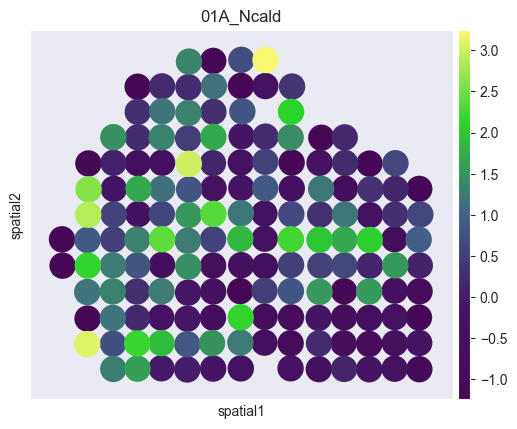

True


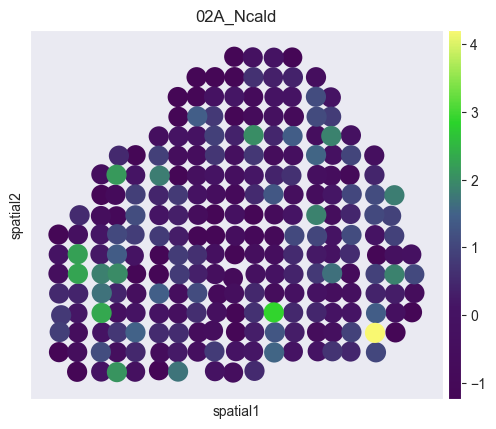

True


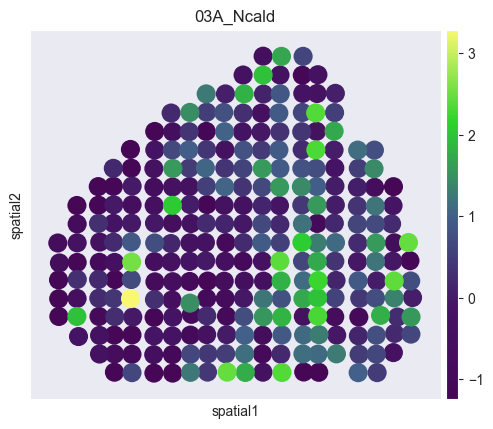

True


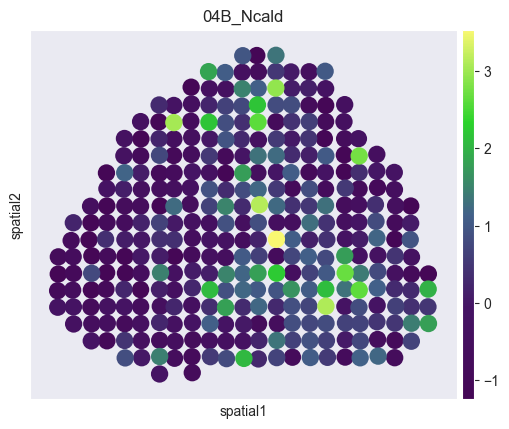

True


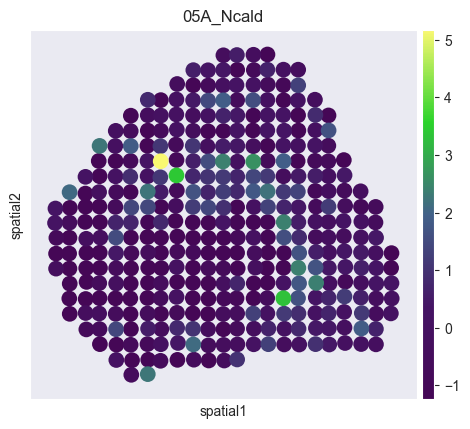

True


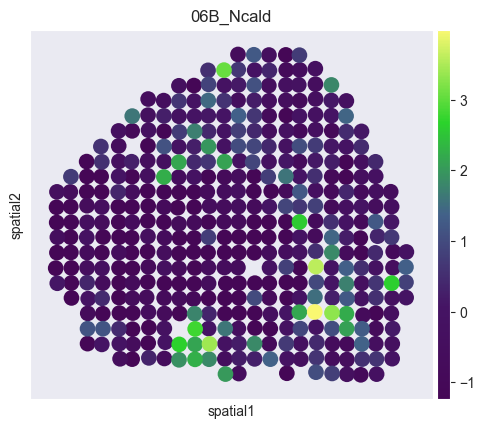

True


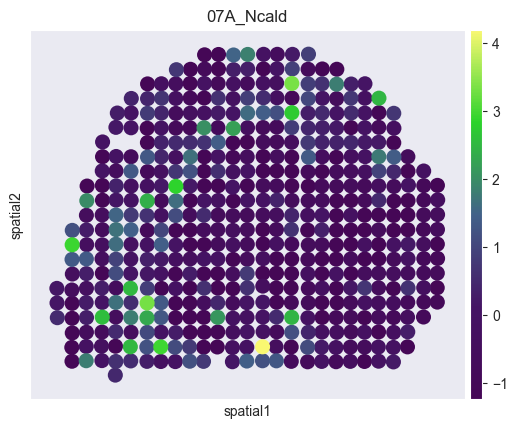

True


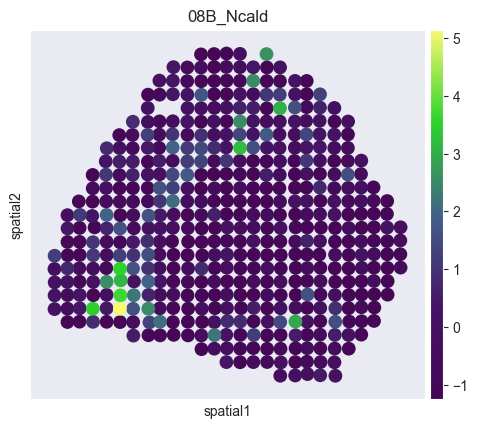

True


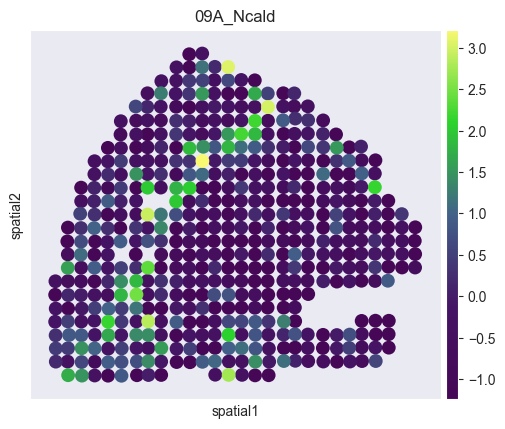

True


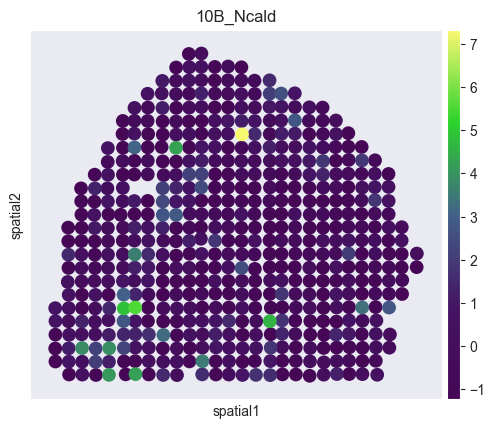

True


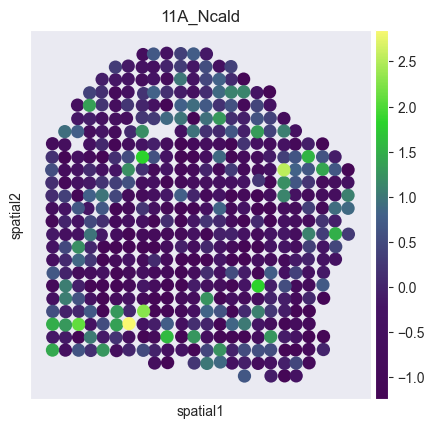

True


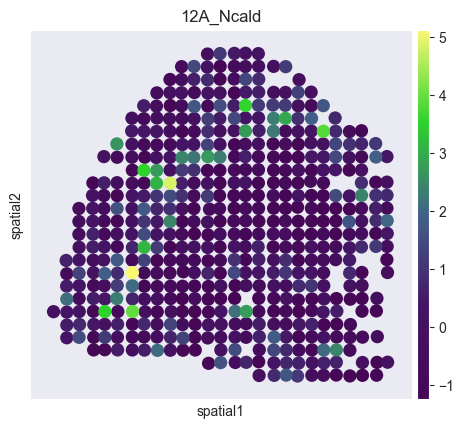

True


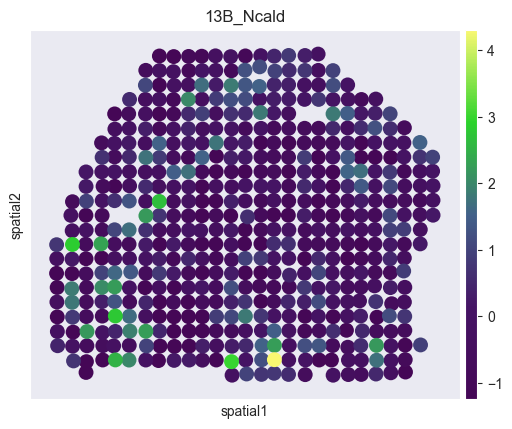

True


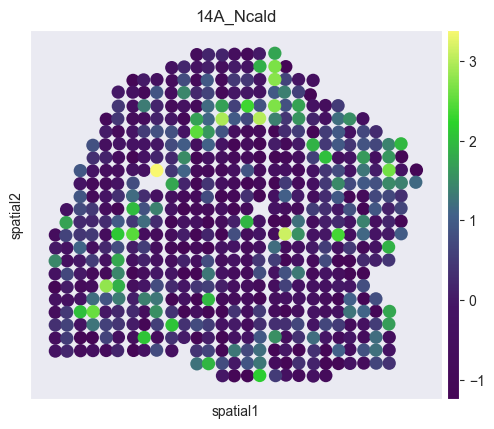

True


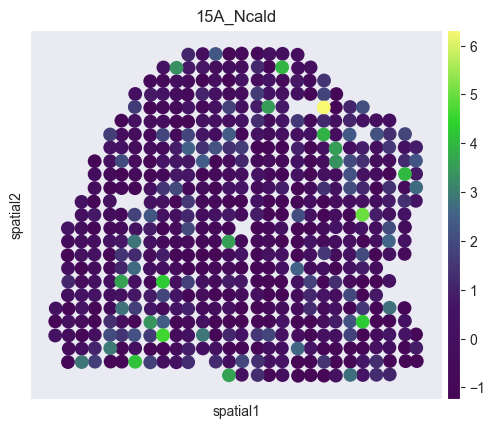

True


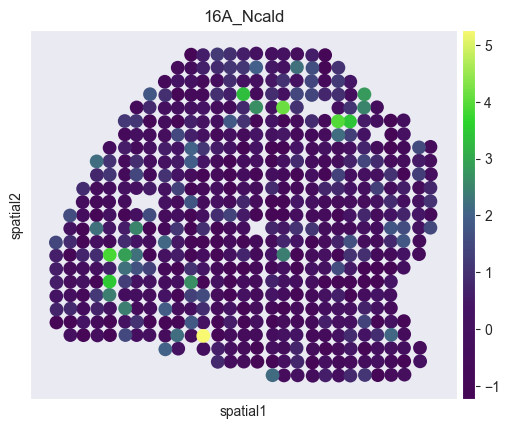

True


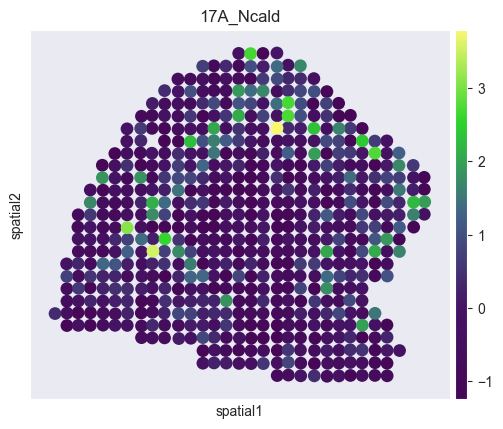

True


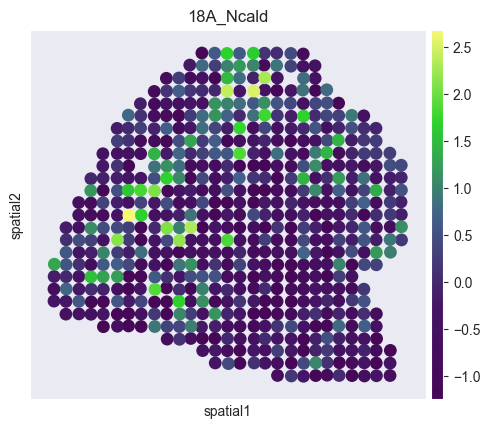

True


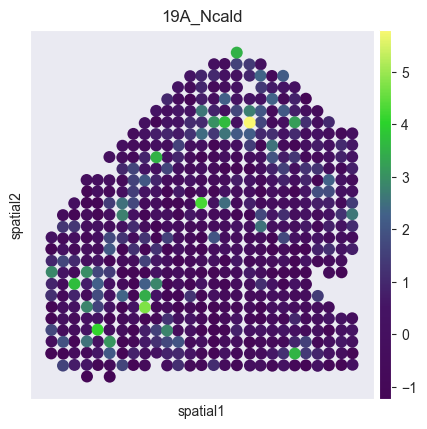

True


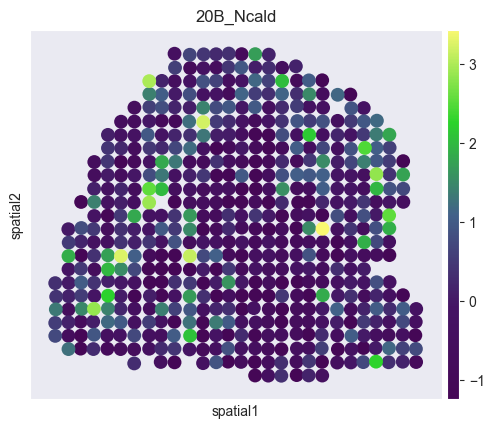

True


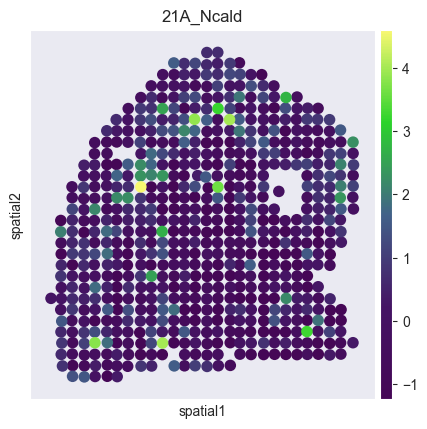

True


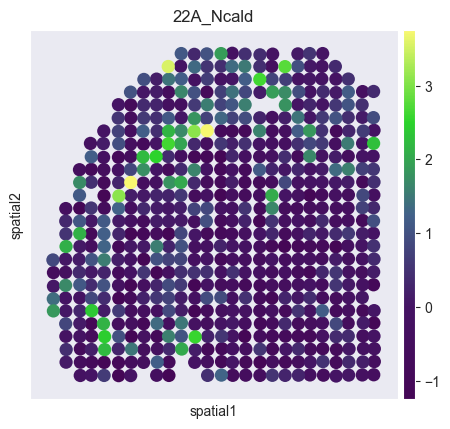

True


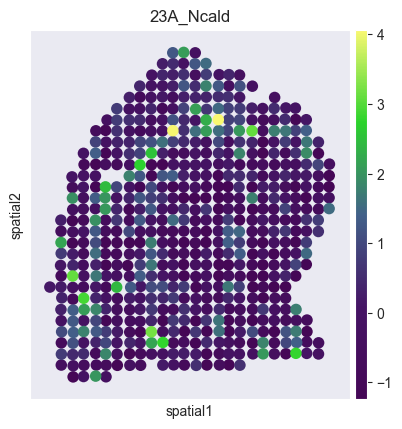

True


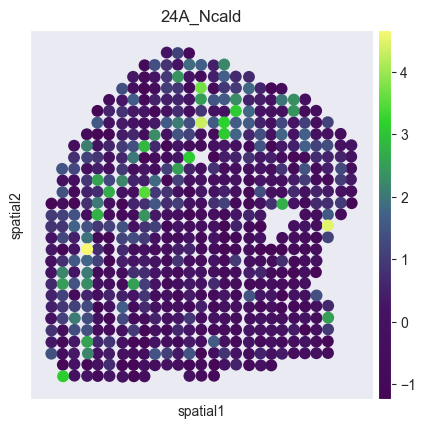

True


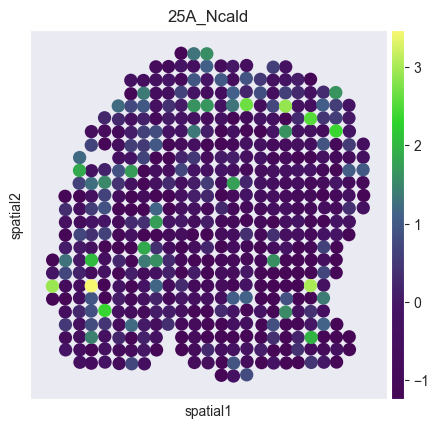

True


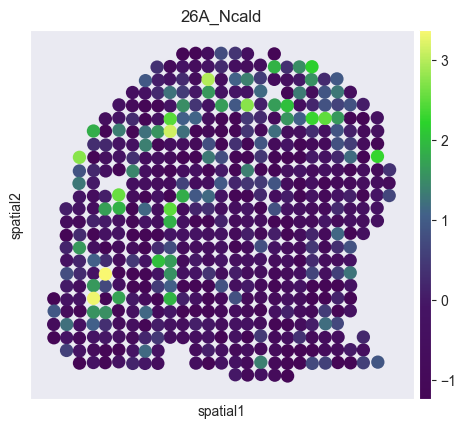

True


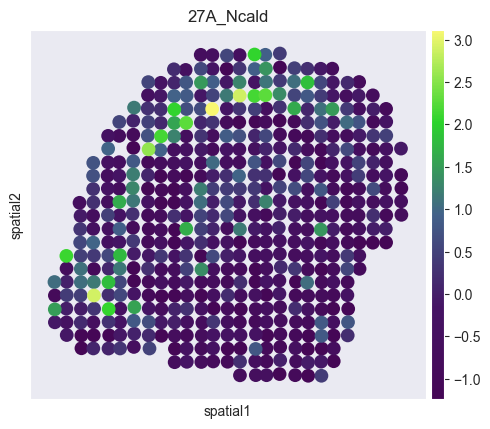

True


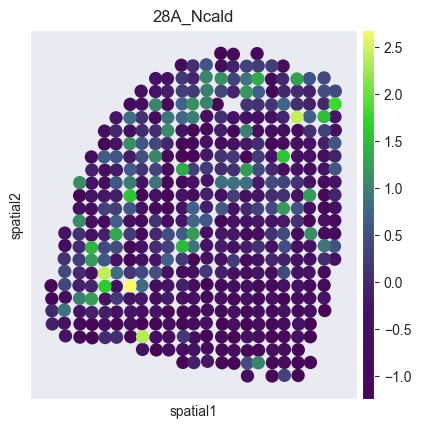

True


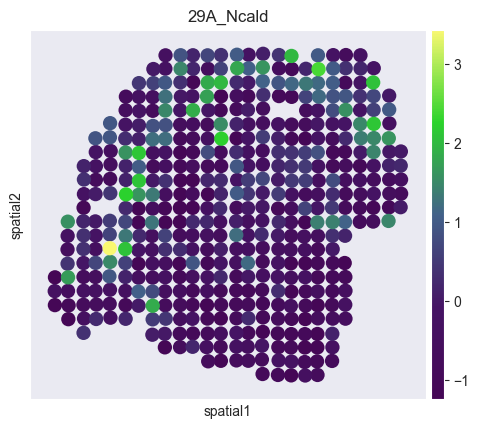

True


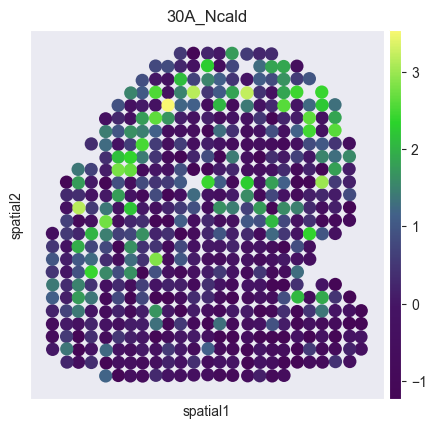

True


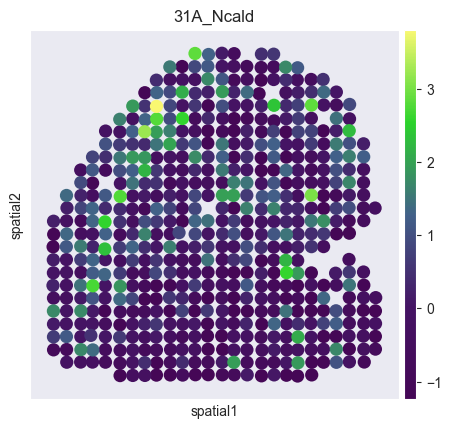

True


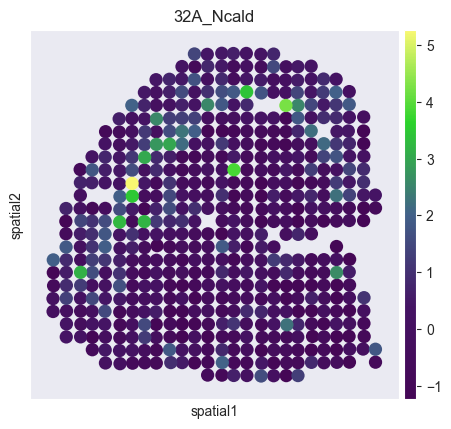

True


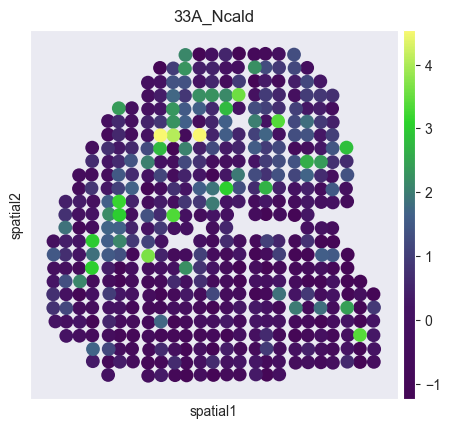

True


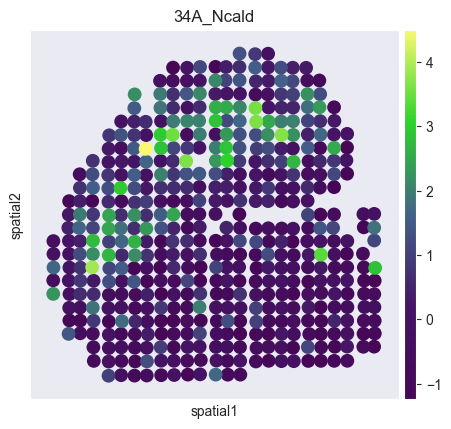

True


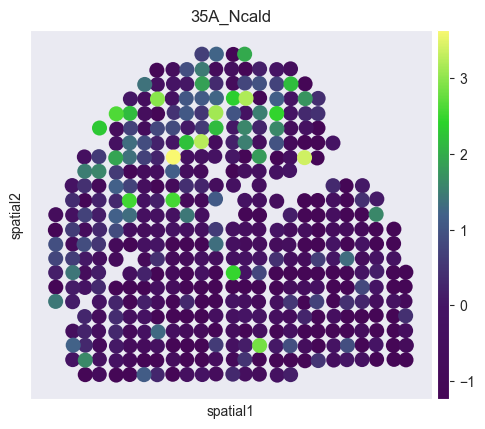

In [30]:
import matplotlib.colors as clr

color_self = clr.LinearSegmentedColormap.from_list('pink_green',
                                                   ['#450756', '#451464', '#426189', '#2BD32B', '#F9F871'], N=256)

for slice_id, slice_name in enumerate(selected_slices):
    adata_tmp = adata[adata.obs[Batch_key] == selected_slices[slice_id]]
    for gene_raw in g_list[1:2]:
        print(gene_raw in adata_tmp.var.index)  # 检查基因是否存在
        idx = adata_tmp.var.index.tolist().index(gene_raw)  #输出基因的idx
        adata_tmp.obs[f'{gene_raw}(raw)'] = np.array(adata_tmp.X[:, idx]) # 稀疏矩阵转为密集矩阵
        
        sc_ = sc.pl.spatial(adata_tmp, img_key="hires",
                            color=f'{gene_raw}(raw)',
                            title=f'{slice_name}'+'_'+gene_raw,
                            color_map=color_self,
                            spot_size=300)
